<a href="https://colab.research.google.com/github/JPP-J/deep-_learning_project/blob/main/DL_4_Image_search.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Image search
- content-based image retrieval (CBIR) :
  - image query
- CLIP:
  - developed by OpenAI
  - images and text query


## Install stuffs
### In this use CLIP from hugging face community

In [ ]:
# Install For download youtube
!pip install yt-dlp

# Install a newer version of plotly
!pip install plotly

# Install CLIP from the GitHub repo
!pip install git+https://github.com/openai/CLIP.git

# Install torch 1.7.1 with GPU support
!pip install torch==1.11.0+cu102 torchvision==0.12.0+cu102 -f https://download.pytorch.org/whl/torch_stable.html

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.1/172.1 kB 11.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 72.5 MB/s eta 0:00:00
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-vrp9s_i1
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-vrp9s_i1
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 3.9 MB/s eta 0:00:00
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369489 sha256=39764c616a019880dc42954a21761a4a32ca2b1f4ff616a500cfb8e17a514577
  Stored in directory: /tmp/pip-ephem-wheel-cache-lddwbajt/wheels/da/2b/4c/d6691fa9597aac8bb85d2ac13b112deb897d5b50f5ad9a37e4
Successfully built clip
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 750.6/750.6 MB 1.2 

## Download Youtube VDO and extract every N-th frame

In [ ]:
import os
import yt_dlp

def download_video(url, quality='360'):
  # Create the directory if it doesn't exist
  os.makedirs('/content/videos', exist_ok=True)

  ydl_opts = {
      "format": f"best[height<={quality}]",
      "outtmpl": "/content/videos/%(title)s.%(ext)s",  # Filename with upload date and title
  }

  with yt_dlp.YoutubeDL(ydl_opts) as ydl:
      ydl.download([url])


In [ ]:
# URL to Youtube VDO
video_url = "https://www.youtube.com/watch?v=tigRPPO2Ioo&t=2s"
download_video(video_url)

[youtube] Extracting URL: https://www.youtube.com/watch?v=tigRPPO2Ioo&t=2s
[youtube] tigRPPO2Ioo: Downloading webpage
[youtube] tigRPPO2Ioo: Downloading ios player API JSON
[youtube] tigRPPO2Ioo: Downloading mweb player API JSON
[youtube] tigRPPO2Ioo: Downloading m3u8 information
[info] tigRPPO2Ioo: Downloading 1 format(s): 18
[download] Resuming download at byte 24709009
[download] Destination: /content/videos/ไกลบ้าน EP51 เวียนนา ออสเตรีย มาแล้วค่า.mp4
[download] 100% of   81.63MiB in 00:00:14 at 5.67MiB/s   


In [ ]:
! ls /content/videos

'ไกลบ้าน EP51 เวียนนา ออสเตรีย มาแล้วค่า.mp4'


In [ ]:
import cv2
from PIL import Image

def get_frame_video(path, n_frame=15):
  # The frame images will be stored in video_frames
  video_frames = []

  # Open the video file
  capture = cv2.VideoCapture(path)     # open video
  fps = capture.get(cv2.CAP_PROP_FPS)  # Retrieves fps

  current_frame = 0

  while capture.isOpened():
      # Read the current frame
      ret, frame = capture.read()

      # Convert it to a PIL image (required for CLIP) and store it
      if ret == True:
          video_frames.append(Image.fromarray(frame[:, :, ::-1]))   # BGR (OpenCV's default format) not RGB like in PIL
      else:
          break

      # Skip N frames
      N = n_frame
      current_frame += N
      capture.set(cv2.CAP_PROP_POS_FRAMES, current_frame)
  return video_frames, fps

In [ ]:
path = '/content/videos/ไกลบ้าน EP51 เวียนนา ออสเตรีย มาแล้วค่า.mp4'

N = 24
video_frames, fps = get_frame_video(path, n_frame=N) # skip at n_frame

# Print some statistics
print(f'Frame Extract: {len(video_frames)}')

Frame Extract: 2057


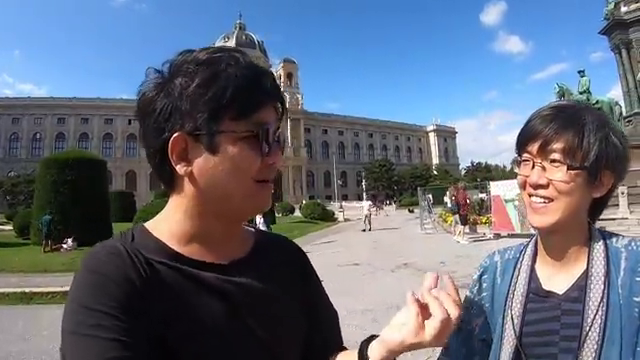

In [ ]:
from IPython.display import Image

# Display the first frame
display(video_frames[555])

## Load CLIP from Hugging Face
- When using vision
- need to load processor of model too : describe how model pre proceeses for pic.
- Also need tokenizer for text components

In [ ]:
from transformers import CLIPModel, AutoProcessor, AutoTokenizer

model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = AutoProcessor.from_pretrained("openai/clip-vit-base-patch32")
tokenizer = AutoTokenizer.from_pretrained("openai/clip-vit-base-patch32")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

In [ ]:
import torch

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Current device: {device}")

model.to(device)

Current device: cuda


CLIPModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 512)
      (position_embedding): Embedding(77, 512)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0): CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=512, out_features=512, bias=True)
            (v_proj): Linear(in_features=512, out_features=512, bias=True)
            (q_proj): Linear(in_features=512, out_features=512, bias=True)
            (out_proj): Linear(in_features=512, out_features=512, bias=True)
          )
          (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=512, out_features=2048, bias=True)
            (fc2): Linear(in_features=2048, out_features=512, bias=True)
          )
          (layer_norm2): LayerNorm((512,), eps=1e-05, element

separate to mini batch

In [ ]:
import math
import numpy as np
import torch

# You can try tuning the batch size for very large videos, but it should usually be OK
batch_size = 64

batches = math.ceil(len(video_frames) / batch_size)

# The encoded features will be stored in video_features
video_features = torch.empty([0, 512], dtype=torch.float16).to(device)

# Process each batch
for i in range(batches):
    print(f"Processing batch {i+1}/{batches}")

    # Get the relevant frames
    batch_frames = video_frames[i*batch_size: (i+1)*batch_size]

    # Preprocess the images for the batch
    batch_preprocessed = processor(images=batch_frames, return_tensors="pt").to(device)

    # Encode with CLIP and normalize
    with torch.no_grad():
      batch_features = model.get_image_features(batch_preprocessed["pixel_values"], output_hidden_states=True)
      batch_features /= batch_features.norm(dim=-1, keepdim=True)

    # Append the batch to the list containing all features
    video_features = torch.cat((video_features, batch_features))

# Print some stats
print(f"Features: {video_features.shape}")


Processing batch 1/33
Processing batch 2/33
Processing batch 3/33
Processing batch 4/33
Processing batch 5/33
Processing batch 6/33
Processing batch 7/33
Processing batch 8/33
Processing batch 9/33
Processing batch 10/33
Processing batch 11/33
Processing batch 12/33
Processing batch 13/33
Processing batch 14/33
Processing batch 15/33
Processing batch 16/33
Processing batch 17/33
Processing batch 18/33
Processing batch 19/33
Processing batch 20/33
Processing batch 21/33
Processing batch 22/33
Processing batch 23/33
Processing batch 24/33
Processing batch 25/33
Processing batch 26/33
Processing batch 27/33
Processing batch 28/33
Processing batch 29/33
Processing batch 30/33
Processing batch 31/33
Processing batch 32/33
Processing batch 33/33
Features: torch.Size([2057, 512])


## Function for display search results

In [ ]:
import plotly.express as px
import datetime
from IPython.core.display import HTML

def search_video(search_query, display_results_count=3):

    # Encode and normalize the search query using CLIP
    with torch.no_grad():
        inputs = tokenizer([search_query], padding=True, return_tensors="pt")
        text_features = model.get_text_features(inputs['input_ids'].to(device))
        text_features /= text_features.norm(dim=-1, keepdim=True)

    # Compute the similarity between the search query and each frame using the Cosine similarity
    similarities = (100.0 * video_features @ text_features.T)
    values, best_photo_idx = similarities.topk(display_results_count, dim=0)

    # Display the top 3 frames
    for frame_id in best_photo_idx:
        display(video_frames[frame_id]) # Display the frame

        # Find the timestamp in the video and display it
        t = int(frame_id.cpu().numpy())  # Ensure frame_id is an integer
        print(f"Frame ID = {t}")

        # Calculate the timestamp in seconds
        seconds = round(t / fps)  # t / fps gives time in seconds
        timestamp = str(datetime.timedelta(seconds=seconds))

        # Generate a clickable timestamp link
        display(HTML(f"""
            Found at {timestamp} (<a target="_blank" href="{video_url}&t={seconds}">Click to open at {timestamp}</a>)
        """))

# Search Image with text

### Example:

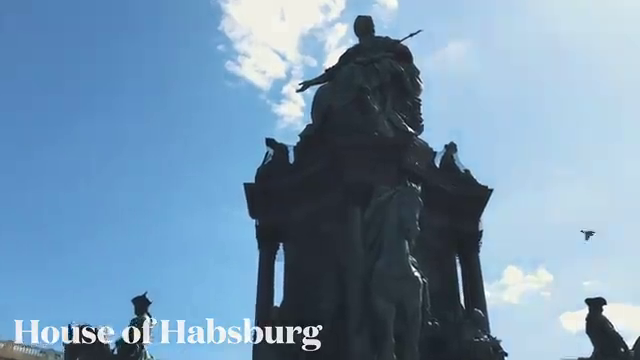

Frame ID = 439


<ipython-input-23-2ee08e2e3651>:22: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  t = int(frame_id.cpu().numpy())  # Ensure frame_id is an integer


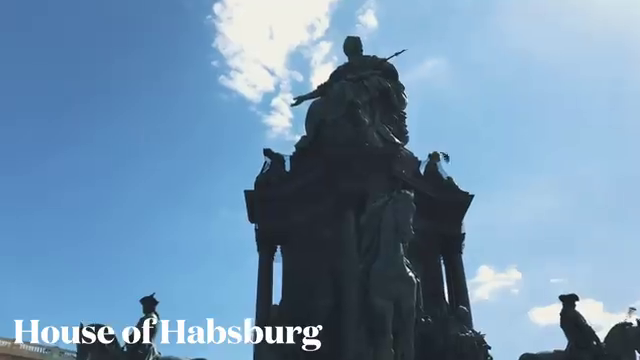

Frame ID = 438


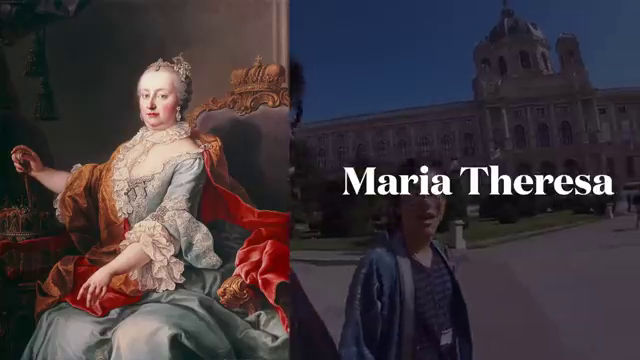

Frame ID = 177


In [ ]:
search_video("Habsburg", display_results_count=3)

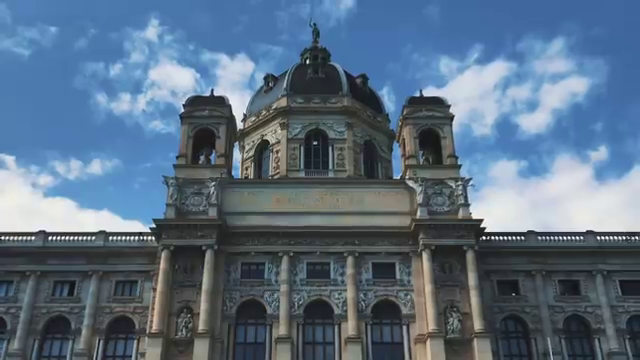

Frame ID = 160


<ipython-input-23-2ee08e2e3651>:22: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  t = int(frame_id.cpu().numpy())  # Ensure frame_id is an integer


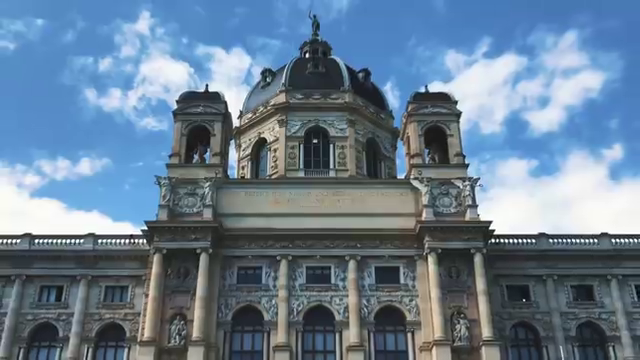

Frame ID = 609


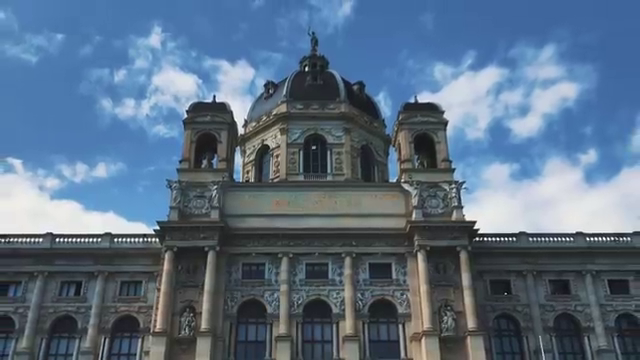

Frame ID = 161


In [ ]:
search_video("castle")

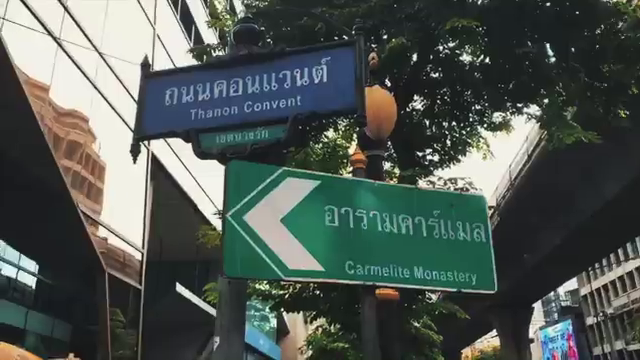

Frame ID = 679


<ipython-input-23-2ee08e2e3651>:22: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  t = int(frame_id.cpu().numpy())  # Ensure frame_id is an integer


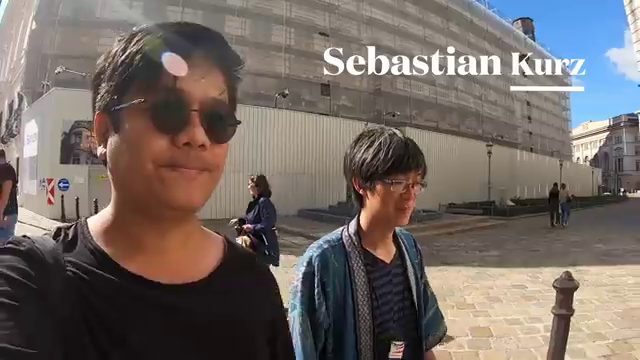

Frame ID = 1316


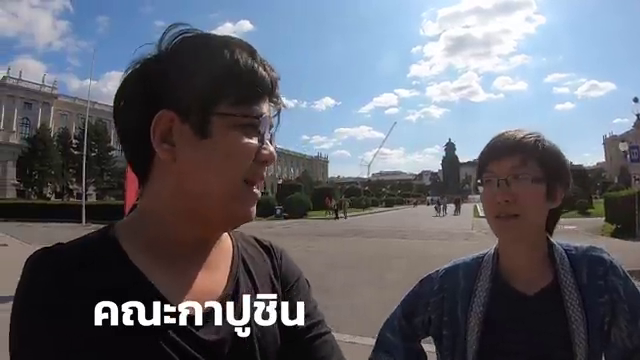

Frame ID = 694


In [ ]:
search_video("ถนน")



---



In [ ]:
import plotly.express as px
import datetime
from IPython.core.display import HTML
from ipywidgets import Checkbox

def search_from_image(pil_img, display_results_count=3):

    # Preprocess the images for the batch
    batch_preprocessed = processor(images=[pil_img], return_tensors="pt").to(device)

    # Encode with CLIP and normalize
    with torch.no_grad():
        image_features = model.get_image_features(batch_preprocessed["pixel_values"], output_hidden_states=True)
        image_features /= image_features.norm(dim=-1, keepdim=True)

    # Compute the similarity between the query and each frame using the Cosine similarity
    similarities = (100.0 * video_features @ image_features.T)
    values, best_photo_idx = similarities.topk(display_results_count, dim=0)

    idx = []
    for frame_id in best_photo_idx:
        idx.append(frame_id.cpu().numpy()[0])

    return idx


In [ ]:
def show_for_feedback(best_photo_idx, show_box=False):

    # Display the top K frames
    boxes = []

    for frame_id in best_photo_idx:
        display(video_frames[frame_id])
        box = Checkbox(False, description='Relevant')

        if show_box:
            display(box)
            boxes.append((frame_id, box)) # !!

    # Find the timestamp in the video and display it
    seconds = round(frame_id * N / fps)
    display(HTML(f"Found at {str(datetime.timedelta(seconds=seconds))} (<a target=\"_blank\" href=\"{video_url}&t={seconds}\">"))

    return boxes

# Search image with image

### Example:

query


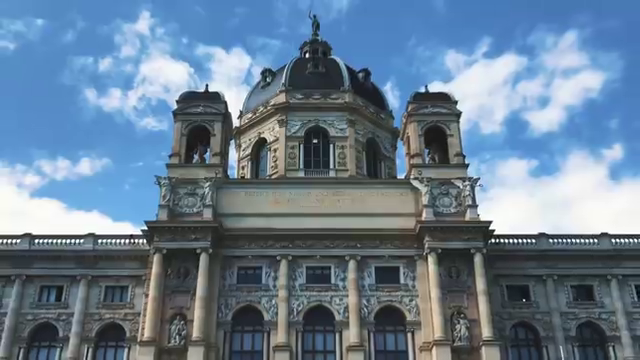

results.........


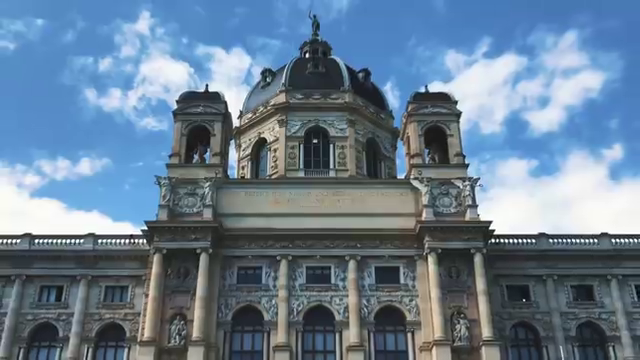

Checkbox(value=False, description='Relevant')

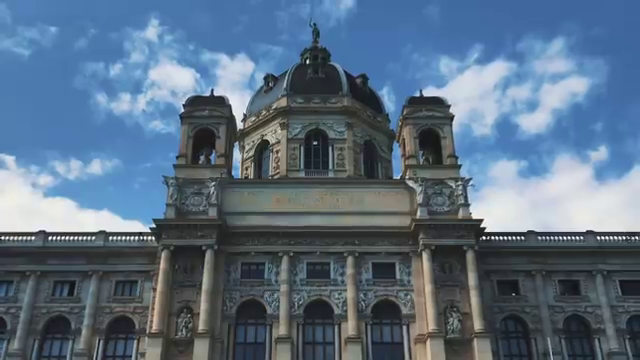

Checkbox(value=False, description='Relevant')

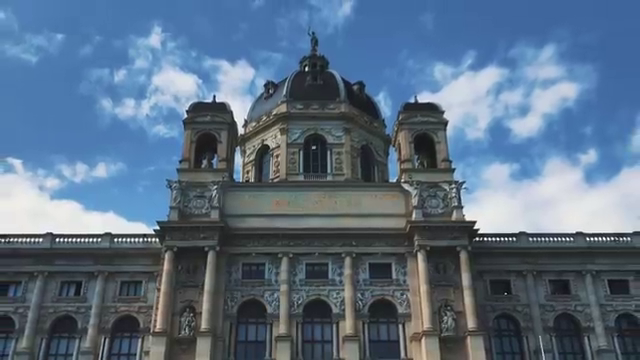

Checkbox(value=False, description='Relevant')

In [ ]:
i = 609
print('query')
display(video_frames[i])
idx = search_from_image(video_frames[i], display_results_count=3)

print("results.........")
boxes = show_for_feedback(idx, show_box=True)

# Search image + Give Relavant Feed back
Construct Graph link each image to its K nearest neighbors

In [ ]:
def construct_graph(K):
    graph = {}

    for i in range(len(video_frames)):
        similarities = video_features @ video_features[i].T

        values, best_photo_idx = similarities.topk(K+1, dim=0)  # >>> K+1 NN
        idx = best_photo_idx.cpu().numpy()
        sim = values.cpu().numpy()

        graph[i] = {
            "nn": idx[1:],  # idx[0] = itself
            "similarity": sim[1:],
        }

    return graph

set: k = 20

In [ ]:
graph = construct_graph(20)

<ipython-input-34-65e71af2fcec>:5: UserWarning: The use of `x.T` on tensors of dimension other than 2 to reverse their shape is deprecated and it will throw an error in a future release. Consider `x.mT` to transpose batches of matricesor `x.permute(*torch.arange(x.ndim - 1, -1, -1))` to reverse the dimensions of a tensor. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2318.)
  similarities = video_features @ video_features[i].T


### Do Label Propagation to assign score to other nodes

In [ ]:
def label_propagation(boxes):
    gt = np.zeros(len(video_frames), dtype=float)

    # Set ground truth values based on boxes
    for i in range(len(boxes)):
        a, b = boxes[i]
        if b.value:
            gt[a] = 1
        else:
            gt[a] = -1

    old_score = np.zeros(len(video_frames), dtype=float)
    score = np.zeros(len(video_frames), dtype=float)

    # Initialize old score
    for i in range(len(boxes)):
        a, b = boxes[i]
        old_score[a] = gt[a]

    # Iterate for label propagation
    for t in range(len(video_frames)):
        # Update score for each frame
        for i in range(len(video_frames)):
            nn = graph[i]["nn"]
            sim = graph[i]["similarity"]

            s, r = 0, 0
            for j in range(len(nn)):
                s += (sim[j] * old_score[nn[j]])
                r += sim[j]

            score[i] = s / r if r > 0 else 0.

        # Update old score
        for i in range(len(video_frames)):
            old_score[i] = score[i]

        # Reinforce the ground truth for boxes
        for i in range(len(boxes)):
            a, b = boxes[i]
            old_score[a] = gt[a]

    # Sort and get the top 10 frames
    idx = np.argsort(-old_score)
    idx = idx[:10]

    old_score = np.array(old_score)
    return idx


### Example: with relevant feedback

query


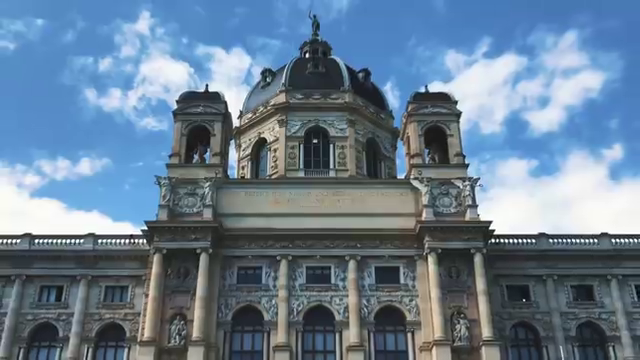

result


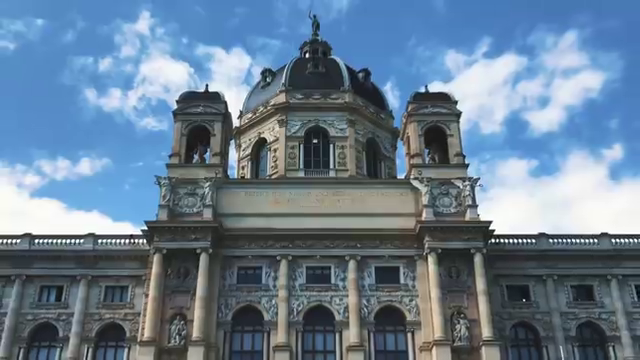

Checkbox(value=False, description='Relevant')

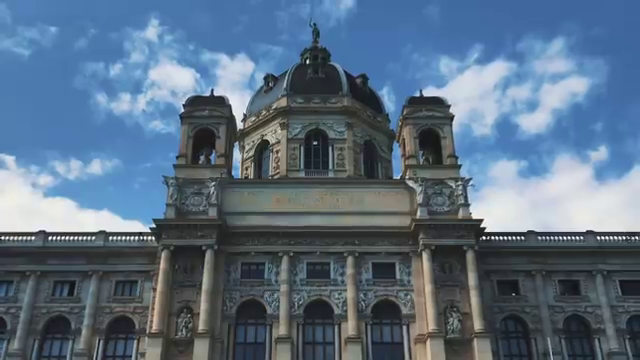

Checkbox(value=False, description='Relevant')

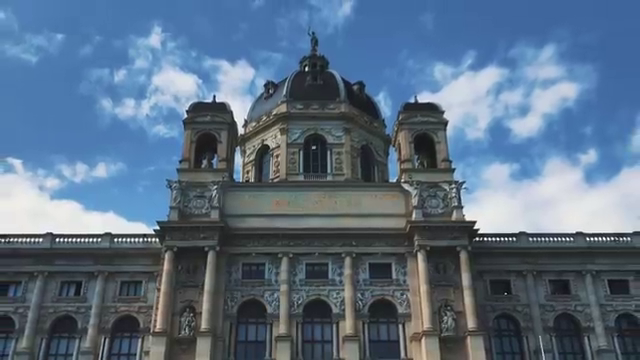

Checkbox(value=False, description='Relevant')

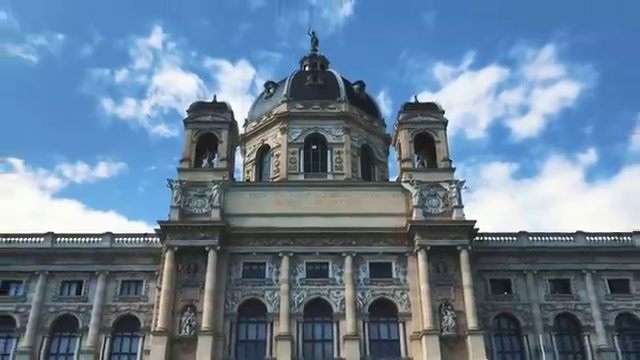

Checkbox(value=False, description='Relevant')

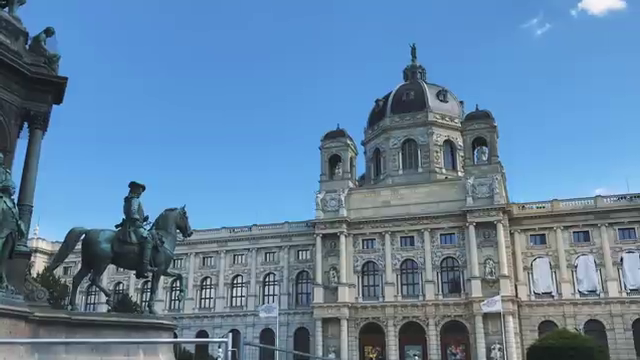

Checkbox(value=False, description='Relevant')

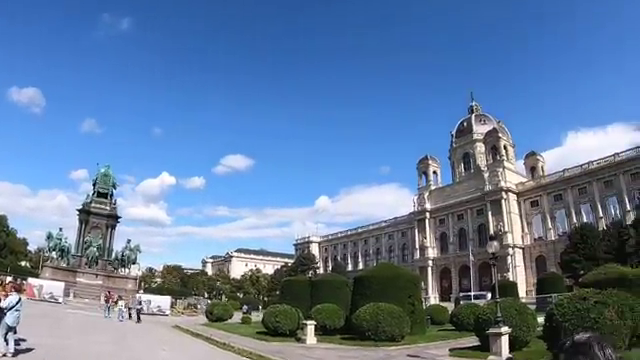

Checkbox(value=False, description='Relevant')

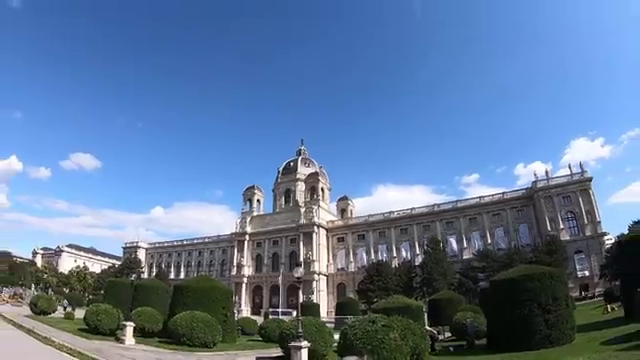

Checkbox(value=False, description='Relevant')

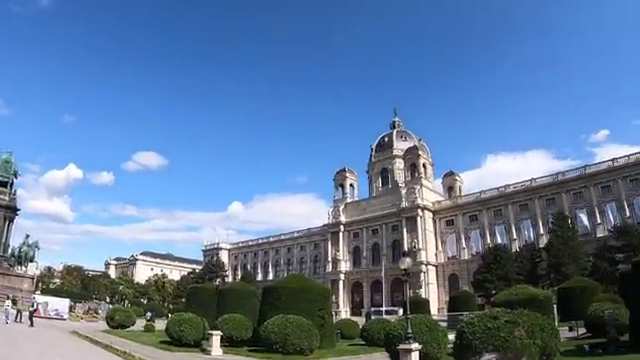

Checkbox(value=False, description='Relevant')

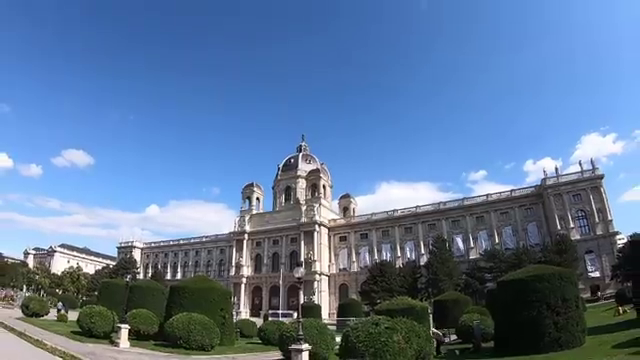

Checkbox(value=False, description='Relevant')

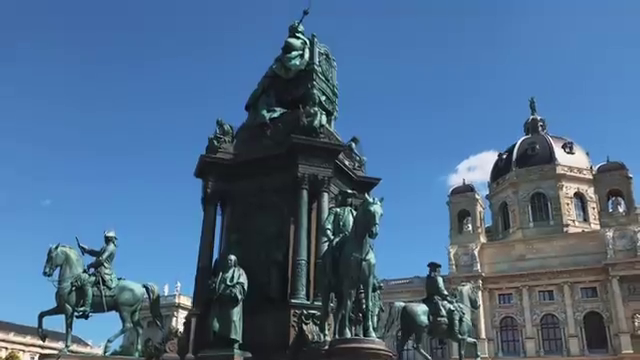

Checkbox(value=False, description='Relevant')

In [ ]:
i = 609

print("query")
display(video_frames[i])

idx = search_from_image(video_frames[i], display_results_count=10)

print("result")
boxes = show_for_feedback(idx, show_box=True)

result


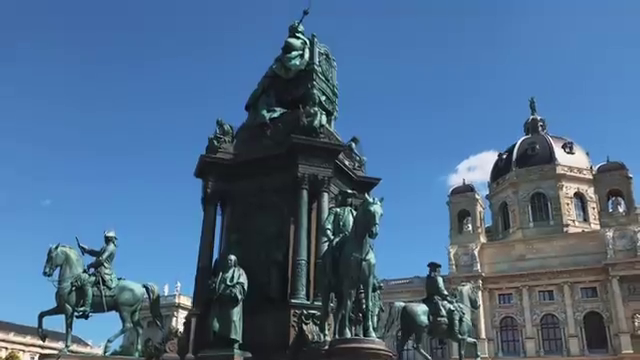

Checkbox(value=False, description='Relevant')

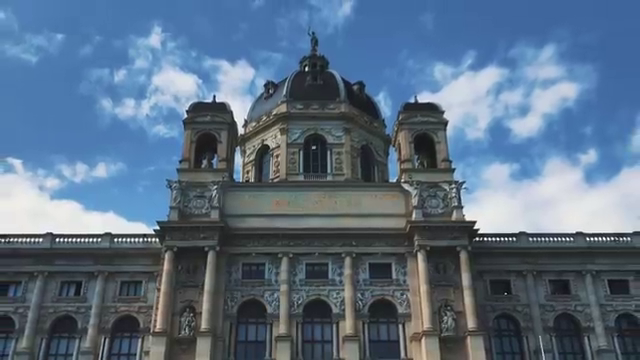

Checkbox(value=False, description='Relevant')

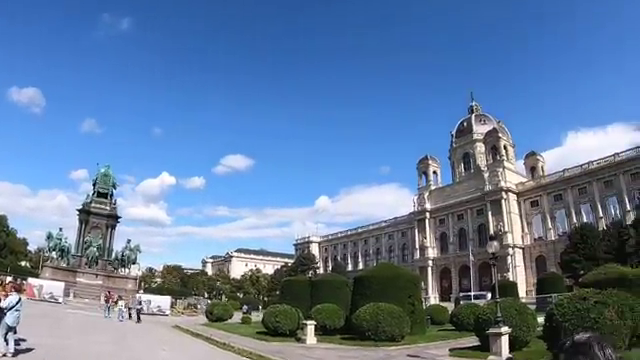

Checkbox(value=False, description='Relevant')

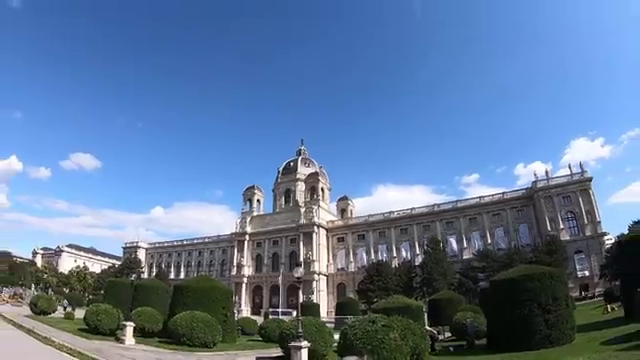

Checkbox(value=False, description='Relevant')

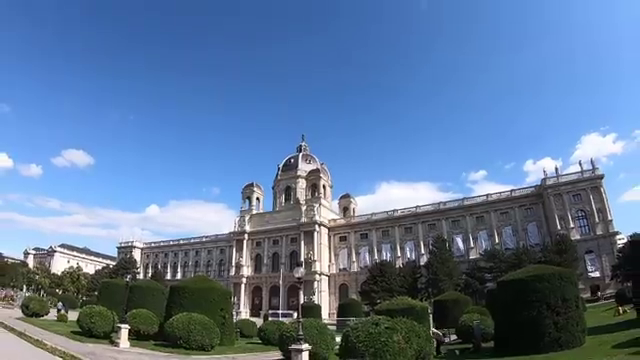

Checkbox(value=False, description='Relevant')

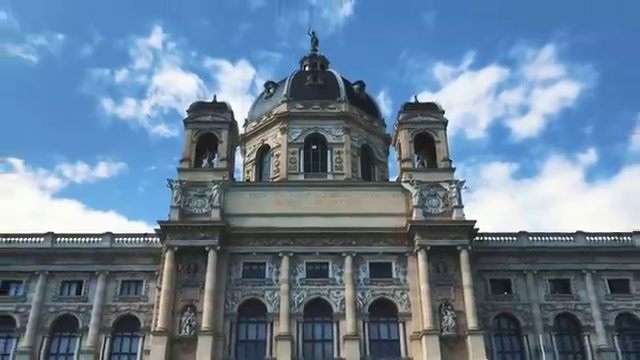

Checkbox(value=False, description='Relevant')

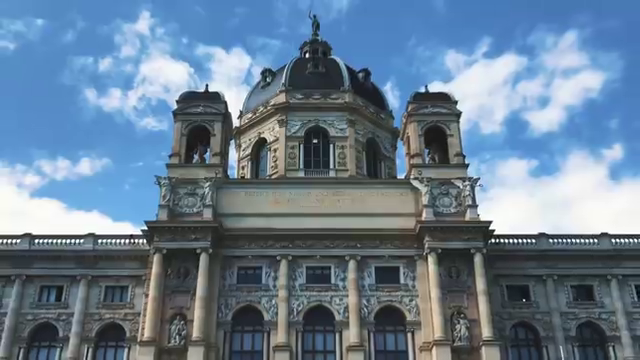

Checkbox(value=False, description='Relevant')

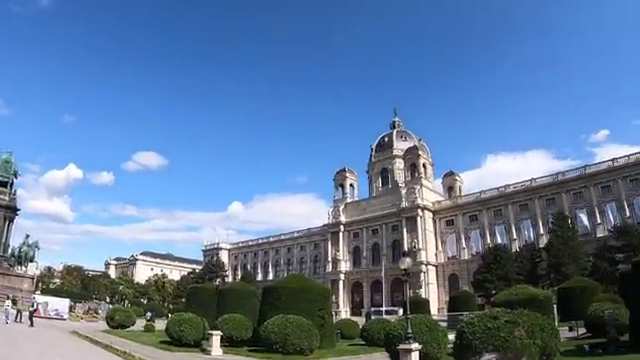

Checkbox(value=False, description='Relevant')

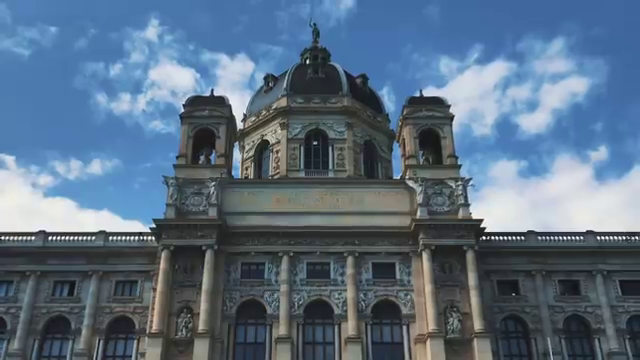

Checkbox(value=False, description='Relevant')

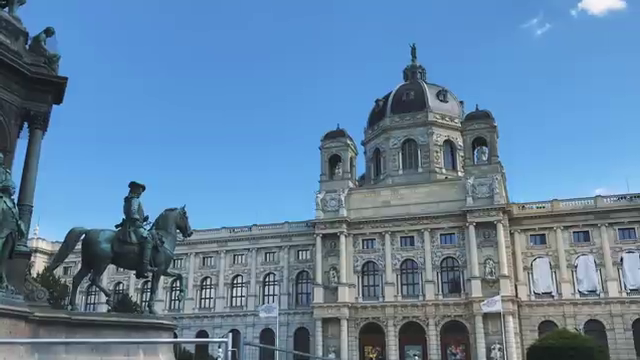

Checkbox(value=False, description='Relevant')

In [ ]:
idx = label_propagation(boxes)

print("result")
boxes = show_for_feedback(idx, show_box=True)